In [1]:
import os
import rasterio as rio
import numpy as np
import shapely
from shapely.geometry import Polygon, MultiPolygon, box
import pyproj
import geopandas as gpd
import matplotlib.pyplot as plt
import rioxarray as riox 
import rasterio as rio
import xarray as xr
import netCDF4
from osgeo import gdal
import pandas as pd
from datetime import datetime
import dask.array
import matplotlib as mpl
from matplotlib.colors import TwoSlopeNorm, LogNorm
from matplotlib import cm
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
from matplotlib.patches import Patch, Circle
import matplotlib.ticker as mticker
import sklearn
import importlib
import cartopy.crs as ccrs
import cartopy as ctp

In [141]:
# define folder and file paths
folder_HMA = os.path.join('C:',os.sep,'Users','lzell','OneDrive - Colostate','Desktop',"HMA2")
folder_plotting = os.path.join(folder_HMA, 'Plotting')
folder_climate = os.path.join(folder_HMA, 'Datasets', 'climate', 'era5land_tifs')

# open rgi
path_rgi = os.path.join(folder_HMA, 'Datasets', "AOI definition", "Final AOI", "final Products", "AOI_full_rgi.shp")
path_dc = os.path.join(folder_HMA, 'Datasets', "AOI definition", "Final AOI", "final Products", "AOI_dc_rgi.shp")
path_rgi_5km = os.path.join(folder_HMA, 'Datasets', "AOI definition", "Final AOI", "final Products", "AOI_5km.shp")
rgi_gdf = gpd.read_file(path_rgi).to_crs("ESRI:102025")
dc_gdf = gpd.read_file(path_rgi).to_crs("ESRI:102025")
aoi_5km_gdf = gpd.read_file(path_rgi_5km).to_crs("ESRI:102025")
aoi_50km_shape = gpd.GeoSeries(shapely.unary_union(aoi_5km_gdf.geometry.buffer(45000)[0]))

# open the subregion df
path_o1 = os.path.join(folder_HMA, 'Datasets', "RGI", "RGI2000-v7.0-regions", "RGI2000-v7.0-o1regions.shp")
path_o2 = os.path.join(folder_HMA, 'Datasets', "RGI", "RGI2000-v7.0-regions", "RGI2000-v7.0-o2regions.shp")
o1_gdf = gpd.read_file(path_o1).to_crs("ESRI:102025")
o2_gdf_all = gpd.read_file(path_o2).to_crs("ESRI:102025")

# subset to the HMA regions
o1_gdf = o1_gdf[o1_gdf['o1region'].isin(["13","14","15"])]
o2_gdf = o2_gdf_all[o2_gdf_all['o2region'].isin(rgi_gdf['o2region'])].copy() # only get o2regions with our glaciers

In [3]:
# opening a Natural Earth background
path_background = os.path.join(folder_plotting, 'NE1_HR_LC', "NE1_HR_LC_projected.tif")
background_im = riox.open_rasterio(path_background)

path_background2 = os.path.join(folder_plotting, 'NE1_HR_LC', "NE1_HR_LC_shean_aee.tif")
background_im2 = riox.open_rasterio(path_background2)

# clip to main extent
xlims = (-2500000, 1000000)
ylims = (-700000, 2000000)
background_im = background_im.sel(x=slice(xlims[0]-2000,xlims[1]+2000), y=slice(ylims[1]+2000, ylims[0]-2000))

xlims2 = (-1700000,2000000)
ylims2 = (-1100000,1000000)
background_im2 = background_im2.sel(x=slice(xlims2[0]-2000,xlims2[1]+2000), y=slice(ylims2[1]+2000, ylims2[0]-2000))


In [4]:
# open rivers and lakes and countries etc
path_rivers = os.path.join(folder_plotting, 'ne_10m_rivers_lake_centerlines', "ne_10m_rivers_lake_centerlines.shp")
path_lakes = os.path.join(folder_plotting, 'ne_10m_lakes', "ne_10m_lakes.shp")
path_countries = os.path.join(folder_plotting, 'ne_10m_admin_0_boundary_lines_land', "ne_10m_admin_0_boundary_lines_land.shp")
path_cities = os.path.join(folder_plotting, "ne_10m_populated_places_simple", "ne_10m_populated_places_simple.shp")
rivers_gdf = gpd.read_file(path_rivers).to_crs("ESRI:102025")
lakes_gdf = gpd.read_file(path_lakes).to_crs("ESRI:102025")
countries_gdf = gpd.read_file(path_countries).to_crs("ESRI:102025")
cities_gdf = gpd.read_file(path_cities).to_crs("ESRI:102025")

In [5]:
# define esri:102025 projection for cartopy
projection_esri = ccrs.AlbersEqualArea(central_longitude=95.0, central_latitude=30,
                            false_easting=0.0, false_northing=0.0,
                            standard_parallels=(15.0, 65.0), globe=None)

# define hma-specific alber equal area (from david shean)
projection_shean = ccrs.AlbersEqualArea(central_longitude=85.0, central_latitude=36,
                            false_easting=0.0, false_northing=0.0,
                            standard_parallels=(25.0, 47.0), globe=None)

# other matplotlib stuff
mpl.rcParams['font.family'] = 'Arial'
mpl.rcParams['mathtext.fontset'] = 'custom'
mpl.rcParams['mathtext.rm'] = 'Arial'

In [146]:
# # figure showing climate and some background info
# fig,axs = plt.subplots(figsize=(6.5,4), dpi=300, subplot_kw={'projection':ccrs.PlateCarree()})

# # add rgi buffer region
# aoi_50km_shape.plot(ax=axs, edgecolor='grey', facecolor='none', linewidth=0.5,
#                          transform=projection_esri, zorder=3)

# # add inset axis to use for colorbar
# cbar_ax = axs.inset_axes( (0.62, 0.85, 0.35, 0.1) )
# cbar_ax.tick_params(axis='x', labelsize=8)
# cbar_ax.xaxis.label.set_size(8)

# # plot one of our climate variables
# path_open = os.path.join(folder_climate, "p_annual_2014_2023.tif")
# xr_p = riox.open_rasterio(path_open).squeeze('band', drop=True)

# cbar_kwargs = {'orientation':'horizontal', 'shrink':0.5, 'aspect':20,
#                'label':'Total Precipitation (m)'}
# xr_p.plot.imshow(ax=axs, zorder=1, cmap='YlGnBu',
#                 add_colorbar=True, cbar_ax=cbar_ax, cbar_kwargs=cbar_kwargs)

# # # axis limits, etc
# axs.set_xlim(65,107)
# axs.set_ylim(25,45)
# axs.set_title("Annual Precipitation")

# # # add lat/lon gridlines
# gl = axs.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, ypadding=3, xpadding=4,
#               linestyle=(5,(20,20)), linewidth=0.2, color='0', alpha=0.2, zorder=2)

# # gridline edits
# gl.top_labels=False
# gl.right_labels=False
# gl.xlabel_style = {'size':6, 'rotation':'horizontal', 'ha':'center'}
# gl.ylabel_style = {'size':6, 'rotation':'vertical', 'ha':'center'}
# gl.xlocator = mticker.FixedLocator([70, 80, 90, 100])
# gl.ylocator = mticker.FixedLocator([30, 35, 40])

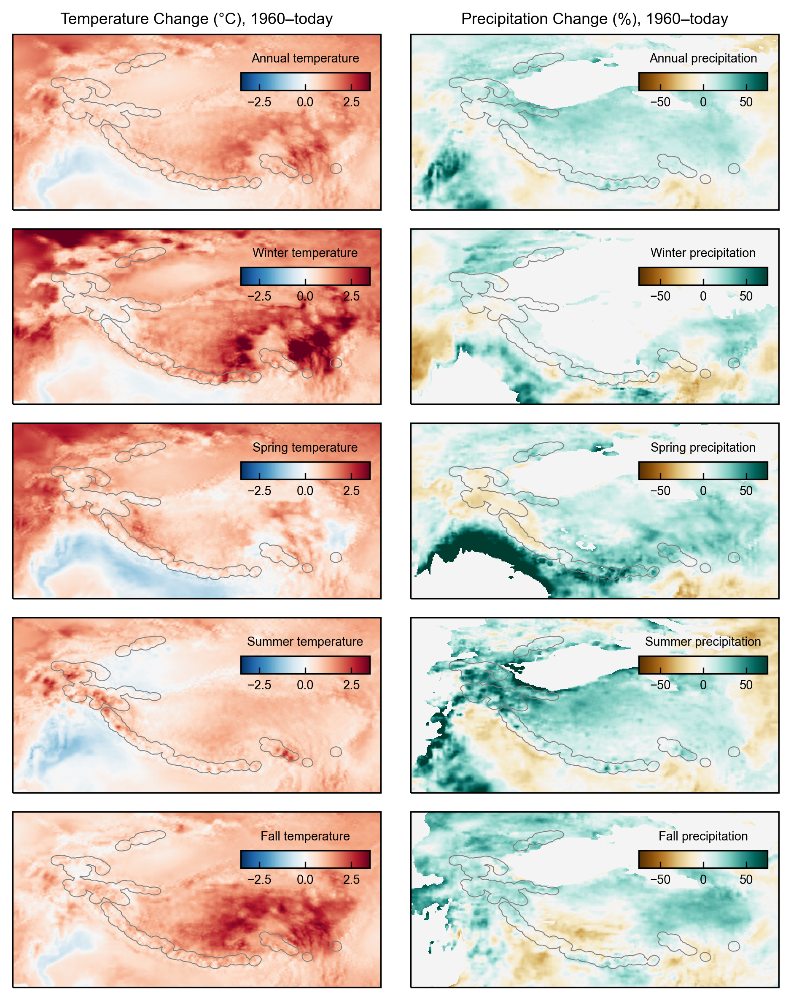

In [207]:
### Changes in moderns seasonal temp/precip relative to baseline
baseline_years = f"{1950}_{1979}"
modern_years = f"{2014}_{2023}"
season='summer'

fig,axs = plt.subplots(5,2, figsize=(6.5,8), dpi=300, subplot_kw={'projection':ccrs.PlateCarree()})

# column 1 is temperature
# column 2 is precip

# define colorbar stuff here. vmin, vmax, cmap
cbar_T = [-3.5, 3.5, 'RdBu_r']
cbar_P = [-75, 75, 'BrBG']
cbar_kwargs = {'orientation':'horizontal', 'shrink':0.5, 'aspect':20, 'extend':'neither',
                       'label':""}

for col,var in enumerate(['t','p']):
    for row,season in enumerate(['annual','winter','spring','summer','fall']):
        
        # grab correct axis
        ax = axs[row,col]

        # add inset axis to use for colorbar
        cbar_ax = ax.inset_axes( (0.62, 0.68, 0.35, 0.1) )
        cbar_ax.tick_params(axis='x', labelsize=7, direction='in')
        cbar_ax.xaxis.label.set_size(7)
        cbar_ax.xaxis.set_label_position('top') 
        
        # add rgi buffer region
        aoi_50km_shape.plot(ax=ax, edgecolor='grey', facecolor='none', linewidth=0.5,
                             transform=projection_esri, zorder=3)
        
        # load baseline data
        path_open = os.path.join(folder_climate, f"{var}_{season}_{baseline_years}.tif")
        baseline = riox.open_rasterio(path_open).squeeze('band', drop=True)
        
        # load modern data
        path_open = os.path.join(folder_climate, f"{var}_{season}_{modern_years}.tif")
        modern = riox.open_rasterio(path_open).squeeze('band', drop=True)
        
        # format accordingly
        if var=='p':
            modern_plot = ((modern-baseline)/baseline)*100
            modern_plot = modern_plot.where( (baseline>0.01) & (modern>0.01), 0)
            # modern = (modern-baseline)
            cbar = cbar_P
            cbar_ax.set_title(f'{season.capitalize()} precipitation', size=7)
        elif var=='t':
            modern_plot = (modern-baseline)
            cbar = cbar_T
            cbar_ax.set_title(f'{season.capitalize()} temperature', size=7)
            
        # plot
        modern_plot.plot.imshow(ax=ax, zorder=1, cmap=cbar[2], vmin=cbar[0], vmax=cbar[1],
                        add_colorbar=True, cbar_ax=cbar_ax, cbar_kwargs=cbar_kwargs)
        
        # axis limits, etc
        ax.set_xlim(65,107)
        ax.set_ylim(25,45)
        ax.set_title("")

axs[0,0].set_title("Temperature Change (°C), 1960–today", fontsize=9)
axs[0,1].set_title("Precipitation Change (%), 1960–today", fontsize=9)
plt.tight_layout()

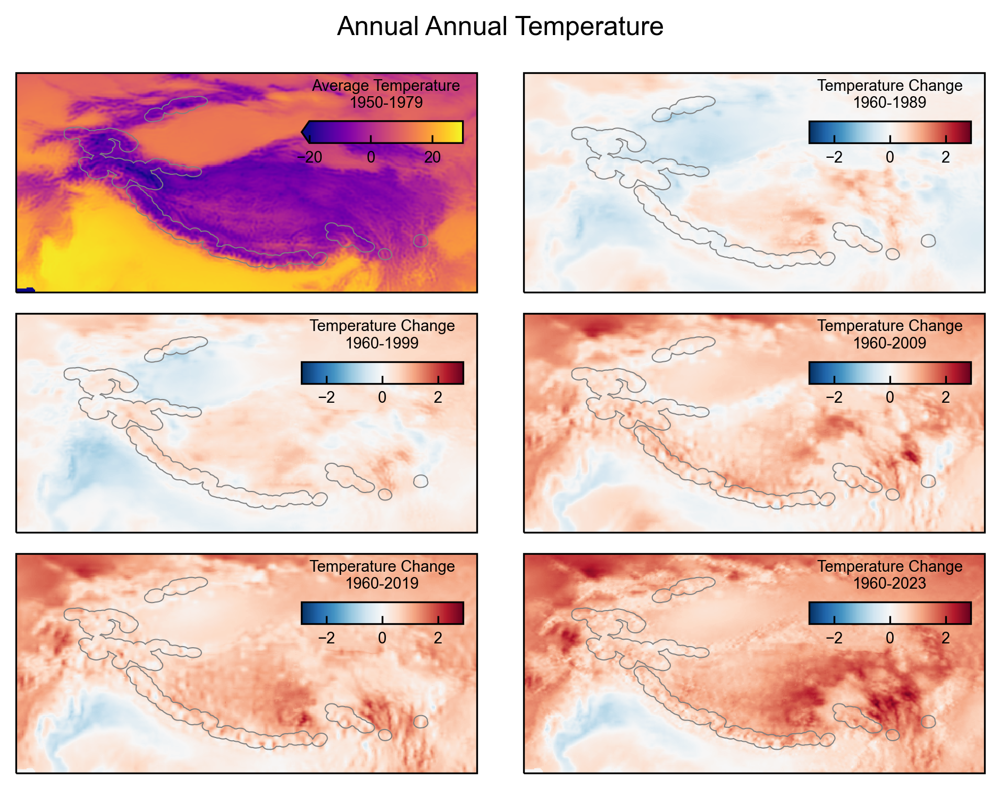

In [148]:
### Changes in summer temperature relative to baseline
season='annual'

fig,axs = plt.subplots(3,2, figsize=(6.5,5), dpi=300, subplot_kw={'projection':ccrs.PlateCarree()})
axs = [axs[0,0], axs[0,1], axs[1,0], axs[1,1], axs[2,0], axs[2,1] ]

# format each axis
for ax in axs:
    
    # add rgi buffer region
    aoi_50km_shape.plot(ax=ax, edgecolor='grey', facecolor='none', linewidth=0.5,
                         transform=projection_esri, zorder=3)
    
    # # axis limits, etc
    ax.set_xlim(65,107)
    ax.set_ylim(25,45)

# add the modern summer temp in the first axis.
# and change in summer temp from 1950-79 to present day in others
path_open = os.path.join(folder_climate, f"t_{season}_{1950}_{1979}.tif")
data_5079 = riox.open_rasterio(path_open).squeeze('band', drop=True)-273.15
    
year_bins = [ [1950,1979], [1980,1989], [1990,1999], [2000,2009], [2010,2019], [2014,2023] ]
for i, ys in enumerate(year_bins):
    
    # grab correct axis
    ax = axs[i]
    
    # add inset axis to use for colorbar
    cbar_ax = ax.inset_axes( (0.62, 0.68, 0.35, 0.1) )
    cbar_ax.tick_params(axis='x', labelsize=7, direction='in')
    cbar_ax.xaxis.label.set_size(7)
    cbar_ax.xaxis.set_label_position('top') 

    if i==0:
        cbar_kwargs = {'orientation':'horizontal', 'shrink':0.5, 'aspect':10,
                       'label':''}
        data_5079.plot.imshow(ax=ax, zorder=1, cmap='plasma', vmin=-20, vmax=30,
                        add_colorbar=True, cbar_ax=cbar_ax, cbar_kwargs=cbar_kwargs)
        cbar_ax.set_title(f'Average Temperature\n{ys[0]}-{ys[1]}', size=7)
        
    else:
        path_open = os.path.join(folder_climate, f"t_{season}_{ys[0]}_{ys[1]}.tif")
        data_ys = riox.open_rasterio(path_open).squeeze('band', drop=True)-273.15
        data_ys = data_ys-data_5079
        cbar_kwargs = {'orientation':'horizontal', 'shrink':0.5, 'aspect':20, 'extend':'neither',
                       'label':""}
        data_ys.plot.imshow(ax=ax, zorder=1, vmin=-2.9, vmax=2.9, cmap='RdBu_r', 
                        add_colorbar=True, cbar_ax=cbar_ax, cbar_kwargs=cbar_kwargs)
        cbar_ax.set_title(f'Temperature Change\n{1960}-{ys[1]}', size=7)

    ax.set_title("")

plt.suptitle(f"Annual {season.capitalize()} Temperature")
plt.tight_layout()

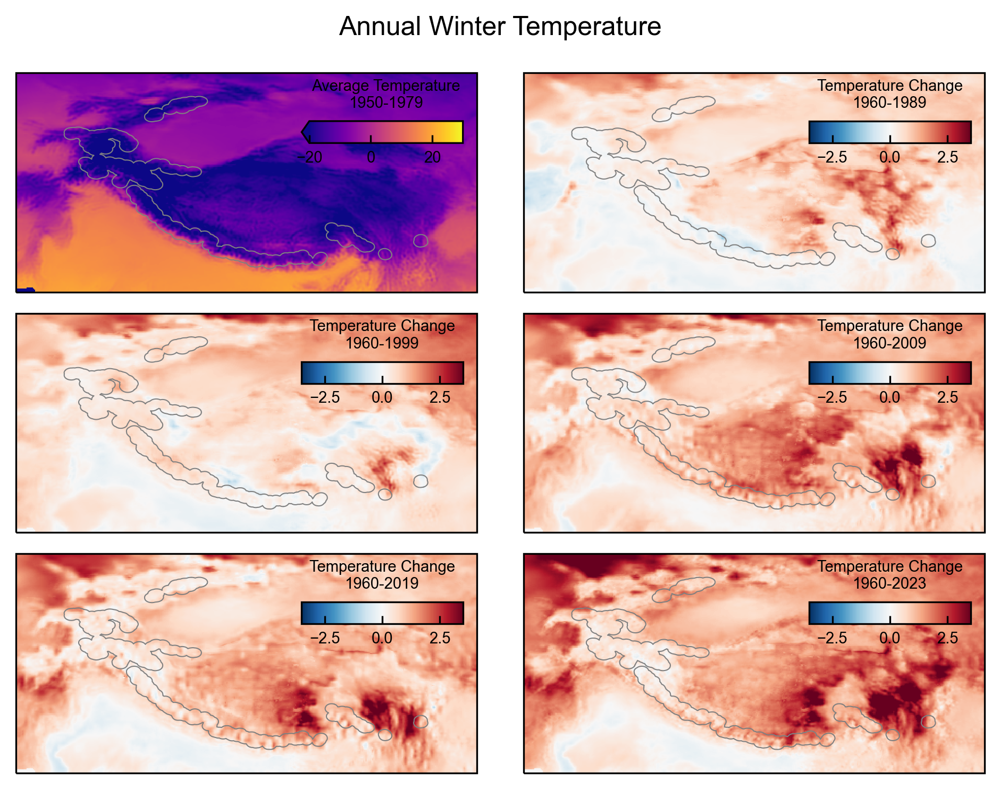

In [151]:
### Changes in winter temperature relative to baseline
season='winter'

fig,axs = plt.subplots(3,2, figsize=(6.5,5), dpi=300, subplot_kw={'projection':ccrs.PlateCarree()})
axs = [axs[0,0], axs[0,1], axs[1,0], axs[1,1], axs[2,0], axs[2,1] ]

# format each axis
for ax in axs:
    
    # add rgi buffer region
    aoi_50km_shape.plot(ax=ax, edgecolor='grey', facecolor='none', linewidth=0.5,
                         transform=projection_esri, zorder=3)
    
    # # axis limits, etc
    ax.set_xlim(65,107)
    ax.set_ylim(25,45)

# add the modern summer temp in the first axis.
# and change in summer temp from 1950-79 to present day in others
path_open = os.path.join(folder_climate, f"t_{season}_{1950}_{1979}.tif")
data_5079 = riox.open_rasterio(path_open).squeeze('band', drop=True)-273.15
    
year_bins = [ [1950,1979], [1980,1989], [1990,1999], [2000,2009], [2010,2019], [2014,2023] ]
for i, ys in enumerate(year_bins):
    
    # grab correct axis
    ax = axs[i]
    
    # add inset axis to use for colorbar
    cbar_ax = ax.inset_axes( (0.62, 0.68, 0.35, 0.1) )
    cbar_ax.tick_params(axis='x', labelsize=7, direction='in')
    cbar_ax.xaxis.label.set_size(7)
    cbar_ax.xaxis.set_label_position('top') 

    if i==0:
        cbar_kwargs = {'orientation':'horizontal', 'shrink':0.5, 'aspect':10,
                       'label':''}
        data_5079.plot.imshow(ax=ax, zorder=1, cmap='plasma', vmin=-20, vmax=30,
                        add_colorbar=True, cbar_ax=cbar_ax, cbar_kwargs=cbar_kwargs)
        cbar_ax.set_title(f'Average Temperature\n{ys[0]}-{ys[1]}', size=7)
        
    else:
        path_open = os.path.join(folder_climate, f"t_{season}_{ys[0]}_{ys[1]}.tif")
        data_ys = riox.open_rasterio(path_open).squeeze('band', drop=True)-273.15
        data_ys = data_ys-data_5079
        cbar_kwargs = {'orientation':'horizontal', 'shrink':0.5, 'aspect':20, 'extend':'neither',
                       'label':""}
        data_ys.plot.imshow(ax=ax, zorder=1, vmin=-3.5, vmax=3.5, cmap='RdBu_r', 
                        add_colorbar=True, cbar_ax=cbar_ax, cbar_kwargs=cbar_kwargs)
        cbar_ax.set_title(f'Temperature Change\n{1960}-{ys[1]}', size=7)

    ax.set_title("")

plt.suptitle(f"Annual {season.capitalize()} Temperature")
plt.tight_layout()

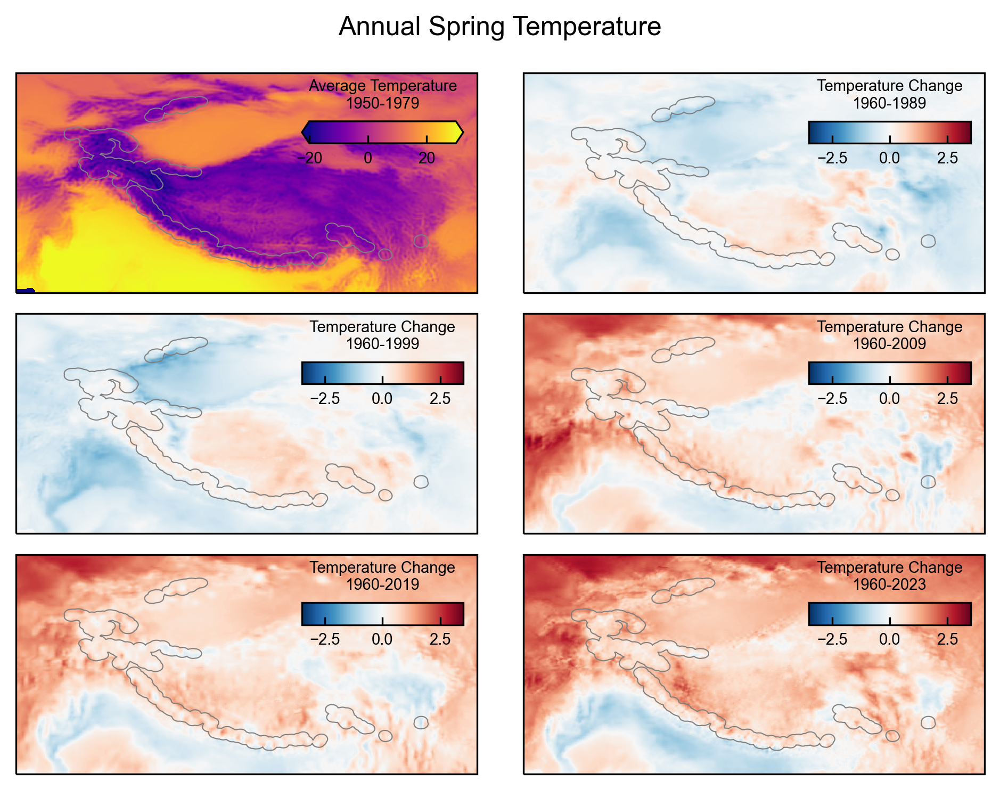

In [152]:
### Changes in spring temperature relative to baseline
season='spring'

fig,axs = plt.subplots(3,2, figsize=(6.5,5), dpi=300, subplot_kw={'projection':ccrs.PlateCarree()})
axs = [axs[0,0], axs[0,1], axs[1,0], axs[1,1], axs[2,0], axs[2,1] ]

# format each axis
for ax in axs:
    
    # add rgi buffer region
    aoi_50km_shape.plot(ax=ax, edgecolor='grey', facecolor='none', linewidth=0.5,
                         transform=projection_esri, zorder=3)
    
    # # axis limits, etc
    ax.set_xlim(65,107)
    ax.set_ylim(25,45)

# add the modern summer temp in the first axis.
# and change in summer temp from 1950-79 to present day in others
path_open = os.path.join(folder_climate, f"t_{season}_{1950}_{1979}.tif")
data_5079 = riox.open_rasterio(path_open).squeeze('band', drop=True)-273.15
    
year_bins = [ [1950,1979], [1980,1989], [1990,1999], [2000,2009], [2010,2019], [2014,2023] ]
for i, ys in enumerate(year_bins):
    
    # grab correct axis
    ax = axs[i]
    
    # add inset axis to use for colorbar
    cbar_ax = ax.inset_axes( (0.62, 0.68, 0.35, 0.1) )
    cbar_ax.tick_params(axis='x', labelsize=7, direction='in')
    cbar_ax.xaxis.label.set_size(7)
    cbar_ax.xaxis.set_label_position('top') 

    if i==0:
        cbar_kwargs = {'orientation':'horizontal', 'shrink':0.5, 'aspect':10,
                       'label':''}
        data_5079.plot.imshow(ax=ax, zorder=1, cmap='plasma', vmin=-20, vmax=30,
                        add_colorbar=True, cbar_ax=cbar_ax, cbar_kwargs=cbar_kwargs)
        cbar_ax.set_title(f'Average Temperature\n{ys[0]}-{ys[1]}', size=7)
        
    else:
        path_open = os.path.join(folder_climate, f"t_{season}_{ys[0]}_{ys[1]}.tif")
        data_ys = riox.open_rasterio(path_open).squeeze('band', drop=True)-273.15
        data_ys = data_ys-data_5079
        cbar_kwargs = {'orientation':'horizontal', 'shrink':0.5, 'aspect':20, 'extend':'neither',
                       'label':""}
        data_ys.plot.imshow(ax=ax, zorder=1, vmin=-3.5, vmax=3.5, cmap='RdBu_r', 
                        add_colorbar=True, cbar_ax=cbar_ax, cbar_kwargs=cbar_kwargs)
        cbar_ax.set_title(f'Temperature Change\n{1960}-{ys[1]}', size=7)

    ax.set_title("")

plt.suptitle(f"Annual {season.capitalize()} Temperature")
plt.tight_layout()

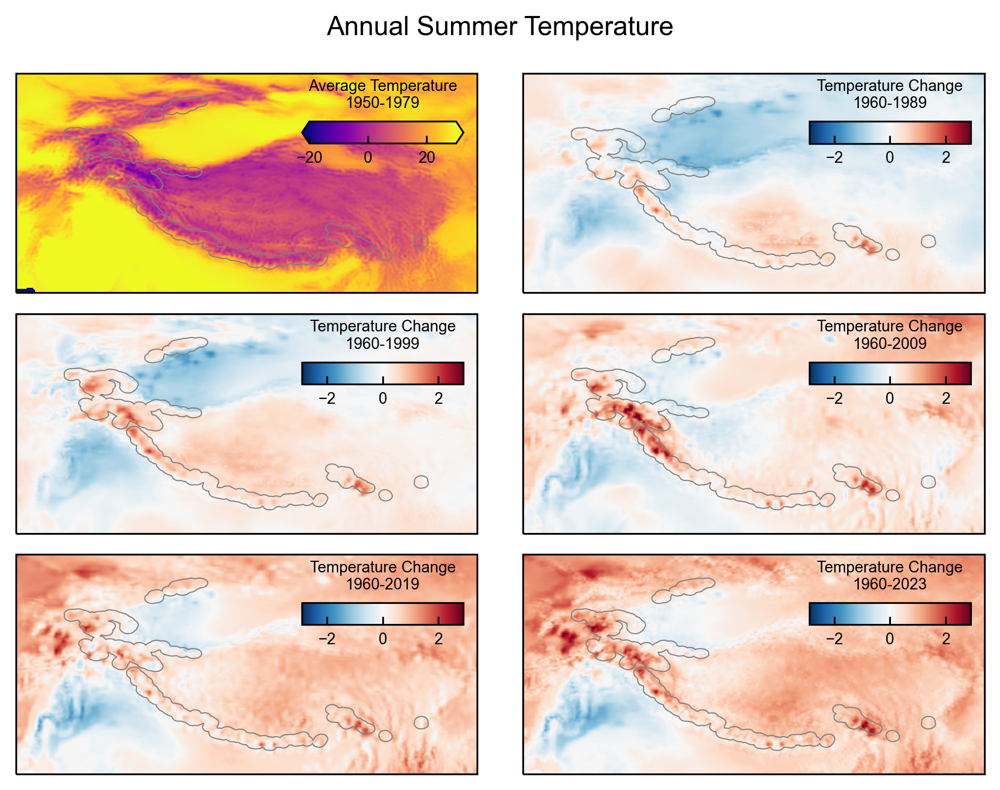

In [143]:
### Changes in summer temperature relative to baseline
season='summer'

fig,axs = plt.subplots(3,2, figsize=(6.5,5), dpi=300, subplot_kw={'projection':ccrs.PlateCarree()})
axs = [axs[0,0], axs[0,1], axs[1,0], axs[1,1], axs[2,0], axs[2,1] ]

# format each axis
for ax in axs:
    
    # add rgi buffer region
    aoi_50km_shape.plot(ax=ax, edgecolor='grey', facecolor='none', linewidth=0.5,
                         transform=projection_esri, zorder=3)
    
    # # axis limits, etc
    ax.set_xlim(65,107)
    ax.set_ylim(25,45)

# add the modern summer temp in the first axis.
# and change in summer temp from 1950-79 to present day in others
path_open = os.path.join(folder_climate, f"t_{season}_{1950}_{1979}.tif")
data_5079 = riox.open_rasterio(path_open).squeeze('band', drop=True)-273.15
    
year_bins = [ [1950,1979], [1980,1989], [1990,1999], [2000,2009], [2010,2019], [2014,2023] ]
for i, ys in enumerate(year_bins):
    
    # grab correct axis
    ax = axs[i]
    
    # add inset axis to use for colorbar
    cbar_ax = ax.inset_axes( (0.62, 0.68, 0.35, 0.1) )
    cbar_ax.tick_params(axis='x', labelsize=7, direction='in')
    cbar_ax.xaxis.label.set_size(7)
    cbar_ax.xaxis.set_label_position('top') 

    if i==0:
        cbar_kwargs = {'orientation':'horizontal', 'shrink':0.5, 'aspect':10,
                       'label':''}
        data_5079.plot.imshow(ax=ax, zorder=1, cmap='plasma', vmin=-20, vmax=30,
                        add_colorbar=True, cbar_ax=cbar_ax, cbar_kwargs=cbar_kwargs)
        cbar_ax.set_title(f'Average Temperature\n{ys[0]}-{ys[1]}', size=7)
        
    else:
        path_open = os.path.join(folder_climate, f"t_{season}_{ys[0]}_{ys[1]}.tif")
        data_ys = riox.open_rasterio(path_open).squeeze('band', drop=True)-273.15
        data_ys = data_ys-data_5079
        cbar_kwargs = {'orientation':'horizontal', 'shrink':0.5, 'aspect':20, 'extend':'neither',
                       'label':""}
        data_ys.plot.imshow(ax=ax, zorder=1, vmin=-2.9, vmax=2.9, cmap='RdBu_r', 
                        add_colorbar=True, cbar_ax=cbar_ax, cbar_kwargs=cbar_kwargs)
        cbar_ax.set_title(f'Temperature Change\n{1960}-{ys[1]}', size=7)

    ax.set_title("")

plt.suptitle(f"Annual {season.capitalize()} Temperature")
plt.tight_layout()

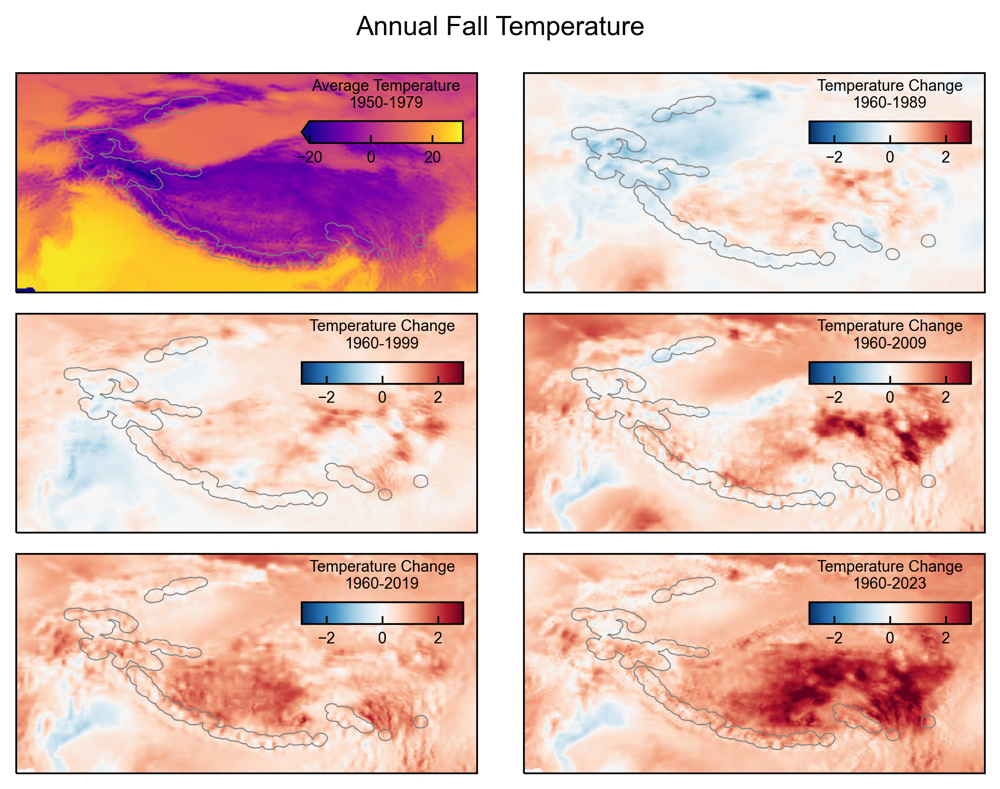

In [153]:
### Changes in fall temperature relative to baseline
season='fall'

fig,axs = plt.subplots(3,2, figsize=(6.5,5), dpi=300, subplot_kw={'projection':ccrs.PlateCarree()})
axs = [axs[0,0], axs[0,1], axs[1,0], axs[1,1], axs[2,0], axs[2,1] ]

# format each axis
for ax in axs:
    
    # add rgi buffer region
    aoi_50km_shape.plot(ax=ax, edgecolor='grey', facecolor='none', linewidth=0.5,
                         transform=projection_esri, zorder=3)
    
    # # axis limits, etc
    ax.set_xlim(65,107)
    ax.set_ylim(25,45)

# add the modern summer temp in the first axis.
# and change in summer temp from 1950-79 to present day in others
path_open = os.path.join(folder_climate, f"t_{season}_{1950}_{1979}.tif")
data_5079 = riox.open_rasterio(path_open).squeeze('band', drop=True)-273.15
    
year_bins = [ [1950,1979], [1980,1989], [1990,1999], [2000,2009], [2010,2019], [2014,2023] ]
for i, ys in enumerate(year_bins):
    
    # grab correct axis
    ax = axs[i]
    
    # add inset axis to use for colorbar
    cbar_ax = ax.inset_axes( (0.62, 0.68, 0.35, 0.1) )
    cbar_ax.tick_params(axis='x', labelsize=7, direction='in')
    cbar_ax.xaxis.label.set_size(7)
    cbar_ax.xaxis.set_label_position('top') 

    if i==0:
        cbar_kwargs = {'orientation':'horizontal', 'shrink':0.5, 'aspect':10,
                       'label':''}
        data_5079.plot.imshow(ax=ax, zorder=1, cmap='plasma', vmin=-20, vmax=30,
                        add_colorbar=True, cbar_ax=cbar_ax, cbar_kwargs=cbar_kwargs)
        cbar_ax.set_title(f'Average Temperature\n{ys[0]}-{ys[1]}', size=7)
        
    else:
        path_open = os.path.join(folder_climate, f"t_{season}_{ys[0]}_{ys[1]}.tif")
        data_ys = riox.open_rasterio(path_open).squeeze('band', drop=True)-273.15
        data_ys = data_ys-data_5079
        cbar_kwargs = {'orientation':'horizontal', 'shrink':0.5, 'aspect':20, 'extend':'neither',
                       'label':""}
        data_ys.plot.imshow(ax=ax, zorder=1, vmin=-2.9, vmax=2.9, cmap='RdBu_r', 
                        add_colorbar=True, cbar_ax=cbar_ax, cbar_kwargs=cbar_kwargs)
        cbar_ax.set_title(f'Temperature Change\n{1960}-{ys[1]}', size=7)

    ax.set_title("")

plt.suptitle(f"Annual {season.capitalize()} Temperature")
plt.tight_layout()

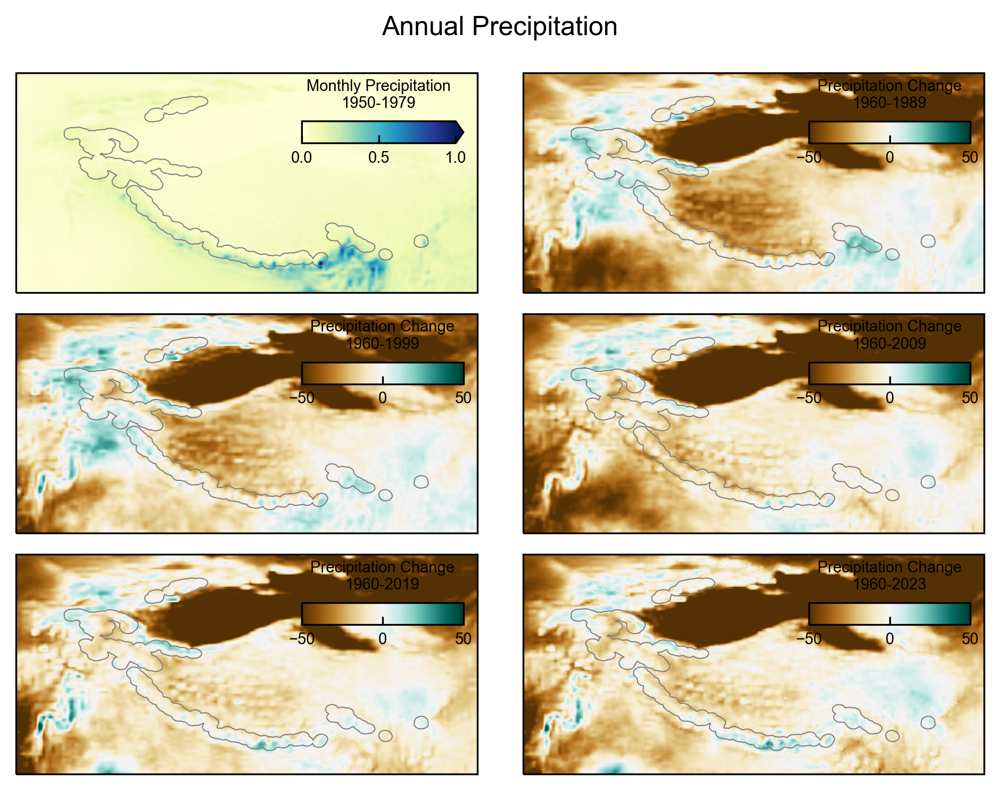

In [170]:
### Changes in annual precipitation relative to baseline
season='annual'

fig,axs = plt.subplots(3,2, figsize=(6.5,5), dpi=300, subplot_kw={'projection':ccrs.PlateCarree()})
axs = [axs[0,0], axs[0,1], axs[1,0], axs[1,1], axs[2,0], axs[2,1] ]

# format each axis
for ax in axs:
    
    # add rgi buffer region
    aoi_50km_shape.plot(ax=ax, edgecolor='grey', facecolor='none', linewidth=0.5,
                         transform=projection_esri, zorder=3)
    
    # # axis limits, etc
    ax.set_xlim(65,107)
    ax.set_ylim(25,45)

# add the modern summer temp in the first axis.
# and change in summer temp from 1950-79 to present day in others
path_open = os.path.join(folder_climate, f"p_{season}_{1950}_{1979}.tif")
data_5079 = riox.open_rasterio(path_open).squeeze('band', drop=True)+0.01
    
year_bins = [ [1950,1979], [1980,1989], [1990,1999], [2000,2009], [2010,2019], [2014,2023] ]
for i, ys in enumerate(year_bins):
    
    # grab correct axis
    ax = axs[i]
    
    # add inset axis to use for colorbar
    cbar_ax = ax.inset_axes( (0.62, 0.68, 0.35, 0.1) )
    cbar_ax.tick_params(axis='x', labelsize=7, direction='in')
    cbar_ax.xaxis.label.set_size(7)
    cbar_ax.xaxis.set_label_position('top') 

    if i==0:
        cbar_kwargs = {'orientation':'horizontal', 'shrink':0.5, 'aspect':10,
                       'label':''}
        data_5079.plot.imshow(ax=ax, zorder=1, cmap='YlGnBu', vmin=0, vmax=1,
                        add_colorbar=True, cbar_ax=cbar_ax, cbar_kwargs=cbar_kwargs)
        cbar_ax.set_title(f'Monthly Precipitation\n{ys[0]}-{ys[1]}', size=7)
        
    else:
        path_open = os.path.join(folder_climate, f"p_{season}_{ys[0]}_{ys[1]}.tif")
        data_ys = riox.open_rasterio(path_open).squeeze('band', drop=True)
        data_ys = (data_ys-data_5079)/data_5079*100
        cbar_kwargs = {'orientation':'horizontal', 'shrink':0.5, 'aspect':20, 'extend':'neither',
                       'label':""}
        data_ys.plot.imshow(ax=ax, zorder=1, vmin=-50, vmax=50, cmap='BrBG', 
                        add_colorbar=True, cbar_ax=cbar_ax, cbar_kwargs=cbar_kwargs)
        cbar_ax.set_title(f'Precipitation Change\n{1960}-{ys[1]}', size=7)

    ax.set_title("")

plt.suptitle(f"{season.capitalize()} Precipitation")
plt.tight_layout()

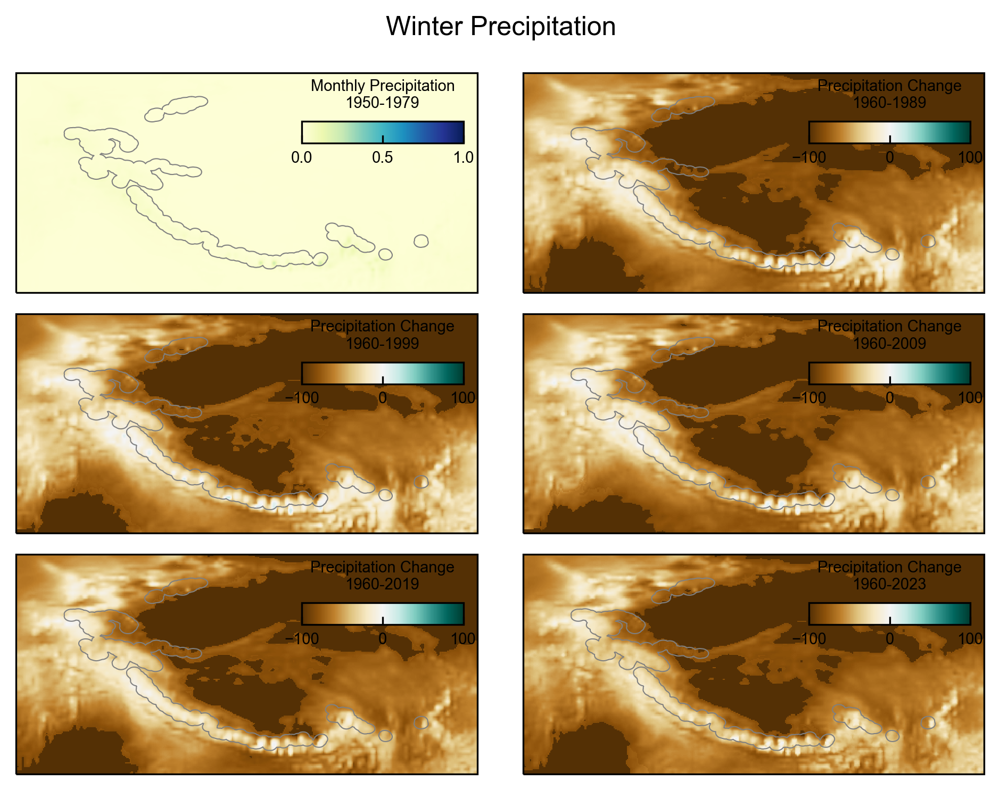

In [172]:
### Changes in winter precipitation relative to baseline
season='winter'

fig,axs = plt.subplots(3,2, figsize=(6.5,5), dpi=300, subplot_kw={'projection':ccrs.PlateCarree()})
axs = [axs[0,0], axs[0,1], axs[1,0], axs[1,1], axs[2,0], axs[2,1] ]

# format each axis
for ax in axs:
    
    # add rgi buffer region
    aoi_50km_shape.plot(ax=ax, edgecolor='grey', facecolor='none', linewidth=0.5,
                         transform=projection_esri, zorder=3)
    
    # # axis limits, etc
    ax.set_xlim(65,107)
    ax.set_ylim(25,45)

# add the modern summer temp in the first axis.
# and change in summer temp from 1950-79 to present day in others
path_open = os.path.join(folder_climate, f"p_{season}_{1950}_{1979}.tif")
data_5079 = riox.open_rasterio(path_open).squeeze('band', drop=True)+0.01
    
year_bins = [ [1950,1979], [1980,1989], [1990,1999], [2000,2009], [2010,2019], [2014,2023] ]
for i, ys in enumerate(year_bins):
    
    # grab correct axis
    ax = axs[i]
    
    # add inset axis to use for colorbar
    cbar_ax = ax.inset_axes( (0.62, 0.68, 0.35, 0.1) )
    cbar_ax.tick_params(axis='x', labelsize=7, direction='in')
    cbar_ax.xaxis.label.set_size(7)
    cbar_ax.xaxis.set_label_position('top') 

    if i==0:
        cbar_kwargs = {'orientation':'horizontal', 'shrink':0.5, 'aspect':10,
                       'label':''}
        data_5079.plot.imshow(ax=ax, zorder=1, cmap='YlGnBu', vmin=0, vmax=1,
                        add_colorbar=True, cbar_ax=cbar_ax, cbar_kwargs=cbar_kwargs)
        cbar_ax.set_title(f'Monthly Precipitation\n{ys[0]}-{ys[1]}', size=7)
        
    else:
        path_open = os.path.join(folder_climate, f"p_{season}_{ys[0]}_{ys[1]}.tif")
        data_ys = riox.open_rasterio(path_open).squeeze('band', drop=True)
        data_ys = (data_ys-data_5079)/data_5079*100
        cbar_kwargs = {'orientation':'horizontal', 'shrink':0.5, 'aspect':20, 'extend':'neither',
                       'label':""}
        data_ys.plot.imshow(ax=ax, zorder=1, vmin=-100, vmax=100, cmap='BrBG', 
                        add_colorbar=True, cbar_ax=cbar_ax, cbar_kwargs=cbar_kwargs)
        cbar_ax.set_title(f'Precipitation Change\n{1960}-{ys[1]}', size=7)

    ax.set_title("")

plt.suptitle(f"{season.capitalize()} Precipitation")
plt.tight_layout()

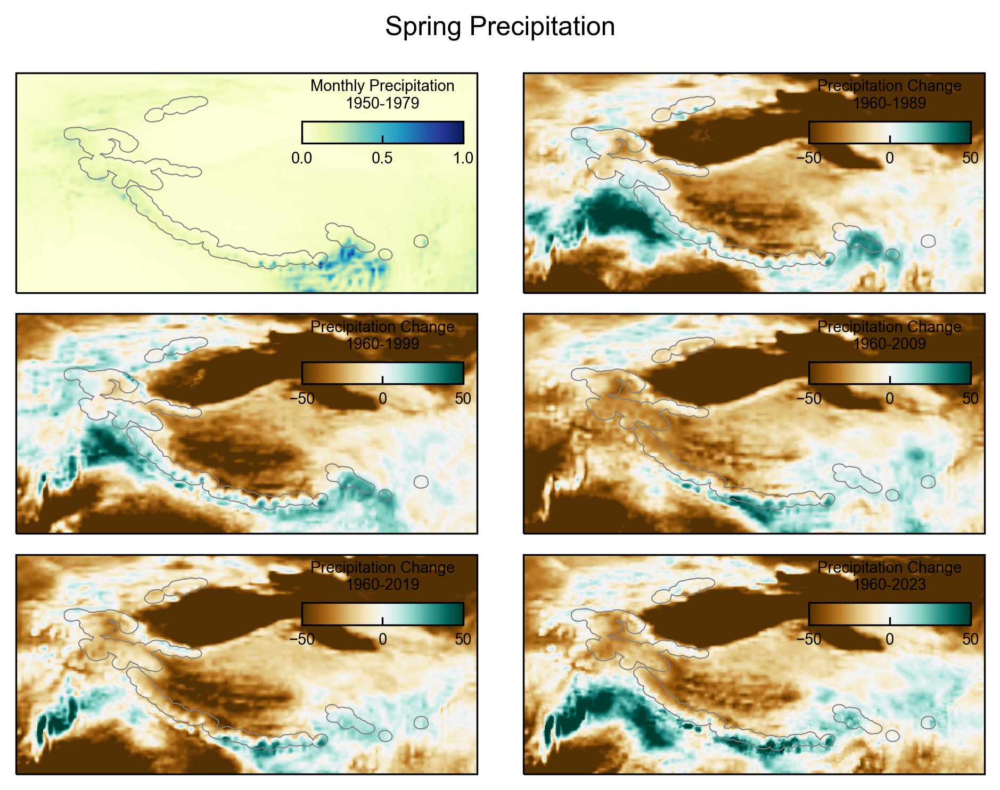

In [174]:
### Changes in spring precipitation relative to baseline
season='spring'

fig,axs = plt.subplots(3,2, figsize=(6.5,5), dpi=300, subplot_kw={'projection':ccrs.PlateCarree()})
axs = [axs[0,0], axs[0,1], axs[1,0], axs[1,1], axs[2,0], axs[2,1] ]

# format each axis
for ax in axs:
    
    # add rgi buffer region
    aoi_50km_shape.plot(ax=ax, edgecolor='grey', facecolor='none', linewidth=0.5,
                         transform=projection_esri, zorder=3)
    
    # # axis limits, etc
    ax.set_xlim(65,107)
    ax.set_ylim(25,45)

# add the modern summer temp in the first axis.
# and change in summer temp from 1950-79 to present day in others
path_open = os.path.join(folder_climate, f"p_{season}_{1950}_{1979}.tif")
data_5079 = riox.open_rasterio(path_open).squeeze('band', drop=True)+0.01
    
year_bins = [ [1950,1979], [1980,1989], [1990,1999], [2000,2009], [2010,2019], [2014,2023] ]
for i, ys in enumerate(year_bins):
    
    # grab correct axis
    ax = axs[i]
    
    # add inset axis to use for colorbar
    cbar_ax = ax.inset_axes( (0.62, 0.68, 0.35, 0.1) )
    cbar_ax.tick_params(axis='x', labelsize=7, direction='in')
    cbar_ax.xaxis.label.set_size(7)
    cbar_ax.xaxis.set_label_position('top') 

    if i==0:
        cbar_kwargs = {'orientation':'horizontal', 'shrink':0.5, 'aspect':10,
                       'label':''}
        data_5079.plot.imshow(ax=ax, zorder=1, cmap='YlGnBu', vmin=0, vmax=1,
                        add_colorbar=True, cbar_ax=cbar_ax, cbar_kwargs=cbar_kwargs)
        cbar_ax.set_title(f'Monthly Precipitation\n{ys[0]}-{ys[1]}', size=7)
        
    else:
        path_open = os.path.join(folder_climate, f"p_{season}_{ys[0]}_{ys[1]}.tif")
        data_ys = riox.open_rasterio(path_open).squeeze('band', drop=True)
        data_ys = (data_ys-data_5079)/data_5079*100
        cbar_kwargs = {'orientation':'horizontal', 'shrink':0.5, 'aspect':20, 'extend':'neither',
                       'label':""}
        data_ys.plot.imshow(ax=ax, zorder=1, vmin=-50, vmax=50, cmap='BrBG', 
                        add_colorbar=True, cbar_ax=cbar_ax, cbar_kwargs=cbar_kwargs)
        cbar_ax.set_title(f'Precipitation Change\n{1960}-{ys[1]}', size=7)

    ax.set_title("")

plt.suptitle(f"{season.capitalize()} Precipitation")
plt.tight_layout()

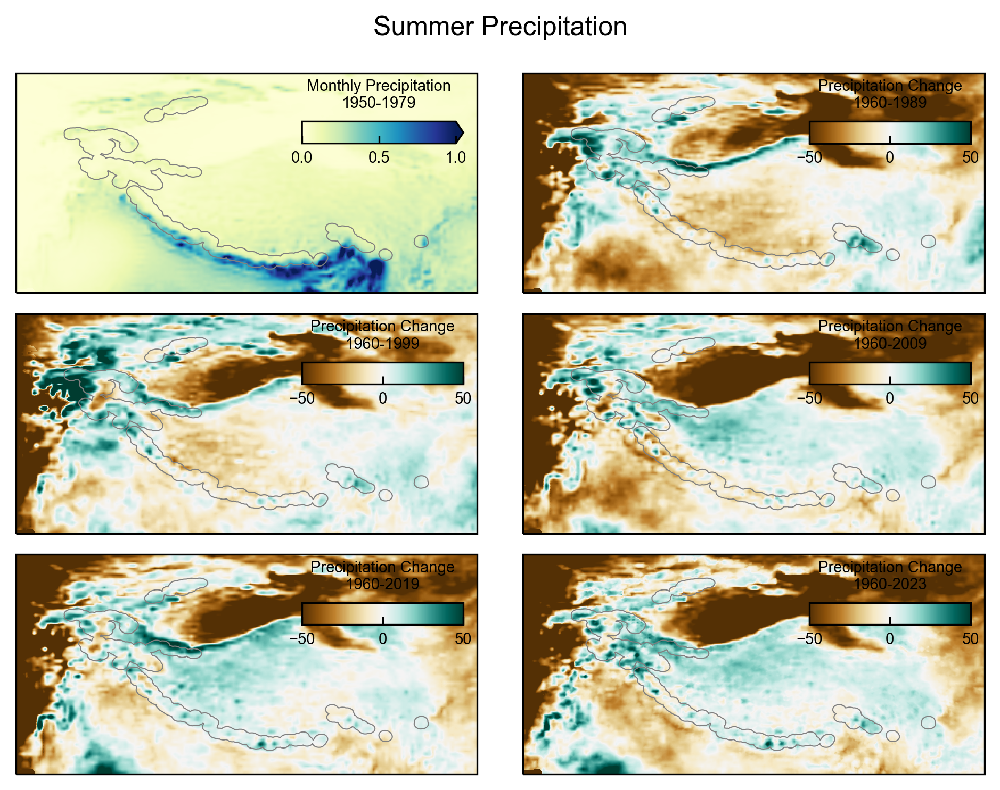

In [175]:
### Changes in spring precipitation relative to baseline
season='summer'

fig,axs = plt.subplots(3,2, figsize=(6.5,5), dpi=300, subplot_kw={'projection':ccrs.PlateCarree()})
axs = [axs[0,0], axs[0,1], axs[1,0], axs[1,1], axs[2,0], axs[2,1] ]

# format each axis
for ax in axs:
    
    # add rgi buffer region
    aoi_50km_shape.plot(ax=ax, edgecolor='grey', facecolor='none', linewidth=0.5,
                         transform=projection_esri, zorder=3)
    
    # # axis limits, etc
    ax.set_xlim(65,107)
    ax.set_ylim(25,45)

# add the modern summer temp in the first axis.
# and change in summer temp from 1950-79 to present day in others
path_open = os.path.join(folder_climate, f"p_{season}_{1950}_{1979}.tif")
data_5079 = riox.open_rasterio(path_open).squeeze('band', drop=True)+0.01
    
year_bins = [ [1950,1979], [1980,1989], [1990,1999], [2000,2009], [2010,2019], [2014,2023] ]
for i, ys in enumerate(year_bins):
    
    # grab correct axis
    ax = axs[i]
    
    # add inset axis to use for colorbar
    cbar_ax = ax.inset_axes( (0.62, 0.68, 0.35, 0.1) )
    cbar_ax.tick_params(axis='x', labelsize=7, direction='in')
    cbar_ax.xaxis.label.set_size(7)
    cbar_ax.xaxis.set_label_position('top') 

    if i==0:
        cbar_kwargs = {'orientation':'horizontal', 'shrink':0.5, 'aspect':10,
                       'label':''}
        data_5079.plot.imshow(ax=ax, zorder=1, cmap='YlGnBu', vmin=0, vmax=1,
                        add_colorbar=True, cbar_ax=cbar_ax, cbar_kwargs=cbar_kwargs)
        cbar_ax.set_title(f'Monthly Precipitation\n{ys[0]}-{ys[1]}', size=7)
        
    else:
        path_open = os.path.join(folder_climate, f"p_{season}_{ys[0]}_{ys[1]}.tif")
        data_ys = riox.open_rasterio(path_open).squeeze('band', drop=True)
        data_ys = (data_ys-data_5079)/data_5079*100
        cbar_kwargs = {'orientation':'horizontal', 'shrink':0.5, 'aspect':20, 'extend':'neither',
                       'label':""}
        data_ys.plot.imshow(ax=ax, zorder=1, vmin=-50, vmax=50, cmap='BrBG', 
                        add_colorbar=True, cbar_ax=cbar_ax, cbar_kwargs=cbar_kwargs)
        cbar_ax.set_title(f'Precipitation Change\n{1960}-{ys[1]}', size=7)

    ax.set_title("")

plt.suptitle(f"{season.capitalize()} Precipitation")
plt.tight_layout()

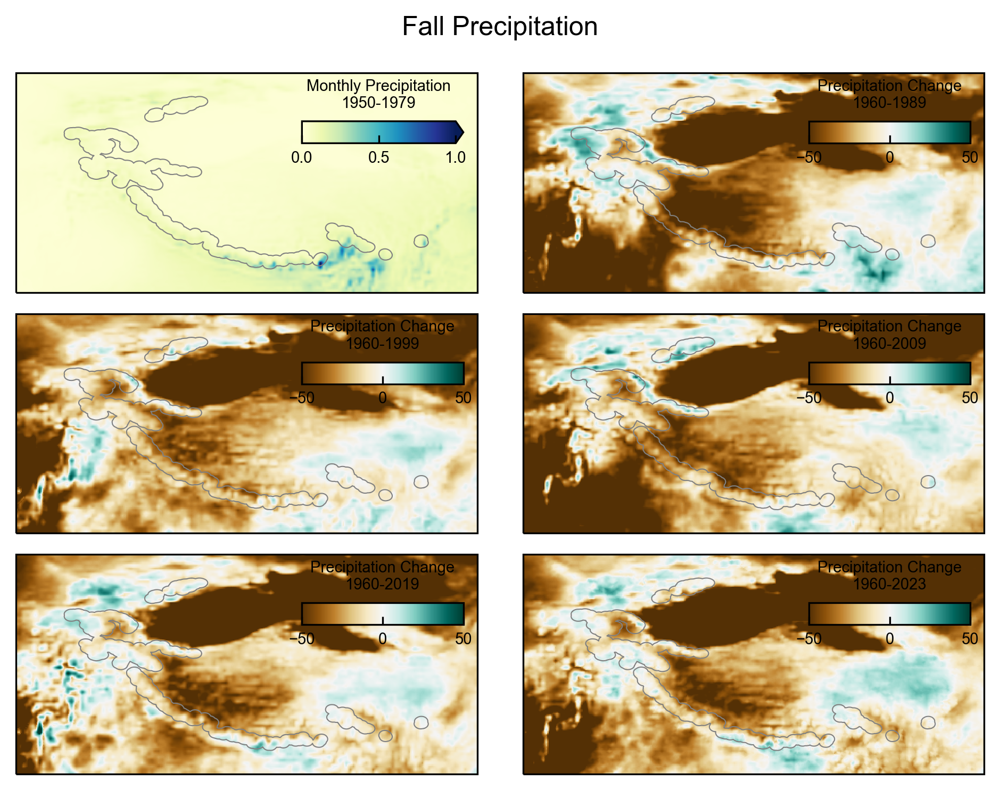

In [176]:
### Changes in spring precipitation relative to baseline
season='fall'

fig,axs = plt.subplots(3,2, figsize=(6.5,5), dpi=300, subplot_kw={'projection':ccrs.PlateCarree()})
axs = [axs[0,0], axs[0,1], axs[1,0], axs[1,1], axs[2,0], axs[2,1] ]

# format each axis
for ax in axs:
    
    # add rgi buffer region
    aoi_50km_shape.plot(ax=ax, edgecolor='grey', facecolor='none', linewidth=0.5,
                         transform=projection_esri, zorder=3)
    
    # # axis limits, etc
    ax.set_xlim(65,107)
    ax.set_ylim(25,45)

# add the modern summer temp in the first axis.
# and change in summer temp from 1950-79 to present day in others
path_open = os.path.join(folder_climate, f"p_{season}_{1950}_{1979}.tif")
data_5079 = riox.open_rasterio(path_open).squeeze('band', drop=True)+0.01
    
year_bins = [ [1950,1979], [1980,1989], [1990,1999], [2000,2009], [2010,2019], [2014,2023] ]
for i, ys in enumerate(year_bins):
    
    # grab correct axis
    ax = axs[i]
    
    # add inset axis to use for colorbar
    cbar_ax = ax.inset_axes( (0.62, 0.68, 0.35, 0.1) )
    cbar_ax.tick_params(axis='x', labelsize=7, direction='in')
    cbar_ax.xaxis.label.set_size(7)
    cbar_ax.xaxis.set_label_position('top') 

    if i==0:
        cbar_kwargs = {'orientation':'horizontal', 'shrink':0.5, 'aspect':10,
                       'label':''}
        data_5079.plot.imshow(ax=ax, zorder=1, cmap='YlGnBu', vmin=0, vmax=1,
                        add_colorbar=True, cbar_ax=cbar_ax, cbar_kwargs=cbar_kwargs)
        cbar_ax.set_title(f'Monthly Precipitation\n{ys[0]}-{ys[1]}', size=7)
        
    else:
        path_open = os.path.join(folder_climate, f"p_{season}_{ys[0]}_{ys[1]}.tif")
        data_ys = riox.open_rasterio(path_open).squeeze('band', drop=True)
        data_ys = (data_ys-data_5079)/data_5079*100
        cbar_kwargs = {'orientation':'horizontal', 'shrink':0.5, 'aspect':20, 'extend':'neither',
                       'label':""}
        data_ys.plot.imshow(ax=ax, zorder=1, vmin=-50, vmax=50, cmap='BrBG', 
                        add_colorbar=True, cbar_ax=cbar_ax, cbar_kwargs=cbar_kwargs)
        cbar_ax.set_title(f'Precipitation Change\n{1960}-{ys[1]}', size=7)

    ax.set_title("")

plt.suptitle(f"{season.capitalize()} Precipitation")
plt.tight_layout()